For this notebook we will use a dedicated environment called "l2rpn_neurips_2020_track1", whihc have 36 substations. Grid2op comes with many different environments, with different problems etc. In this notebook, we will only mention and explain these specific environment.

Power system have one major objective: allow the transmission of electricity from the producers to the consumers as effeciently as possible. In this case we want to reduce the toatal cost for each episodes.

cost $c$ for an episode:
\begin{equation}
c(e)=\sum\limits_{t=1}^{t_{\text{end}}} c_{\text{operations}}(t) + \sum\limits_{t=t_{\text{end}}}^{T_{e}}c_{\text{blackout}}(t)
\end{equation}

where $e$ is "episode" managed by an agent up to a time $t_{\text{end}}$ (on a scenario of maximum length $T_e$) by:

\begin{equation}
e = \left(o_1, a_1, o_2, a_2,\dots, a_{t_{\text{end}}-1}, o_{t_{\text{end}} }\right) \\
\end{equation}






We have design an agent which would perform two major actions:

1. In case of overload (obs.rho > threshold (i.e 1)) when power grid in danger it would try to find the suitable topology change using selected action spaces, which result in maximum load in power grid to be in tolerate range. 

    
2. In case of no overload, it would try to find the line from all the disconnected lines which could result in maximum load in power grid to be less than before.
    
    
  



We are using "l2rpn_neurips_2020_track1" environment in this notebook, this notebook is structure as follows:
1. Analysis of Environment
2. Generation of all feasible actions (~66K possible combination)
3. **topology_agent** creation
4. Evaluation of Agent
5. Conclusion

## 1. Analysis of Environment

In [37]:
# importing libraries 

import os
import time
import grid2op
import numpy as np
import pandas as pd
from copy import deepcopy

from grid2op.PlotGrid import PlotMatplot
import numpy as np

from grid2op.Agent import BaseAgent

import gym
from grid2op.gym_compat import GymEnv
import sys

from IPython import display  # for proper display in jupyter notebook
import matplotlib.pyplot as plt  # pip install matplotlib
from grid2op.Episode import EpisodeReplay
from grid2op.PlotGrid import PlotMatplot
import glob
from IPython.display import Image
from IPython.core.display import display, HTML

from grid2op.Parameters import Parameters
from grid2op.dtypes import dt_bool
from grid2op.Agent.greedyAgent import GreedyAgent
from grid2op.Runner import Runner
from grid2op.dtypes import dt_float


import warnings
warnings.filterwarnings("ignore")

DATA_PATH = './training_data_track1'  # for demo only, use your own dataset
SCENARIO_PATH = './training_data_track1/chronics'

try:
    # if lightsim2grid is available, use it.
    from lightsim2grid import LightSimBackend
    backend = LightSimBackend()
    env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH, backend=backend)
except:
    env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH)

The environment contains all essential information about the power grid such as the substations where the loads, generators and transmission lines are connected, the power flows, and so on.

Number of generators of the powergrid: 22
Number of loads of the powergrid: 37
Number of powerline of the powergrid: 59


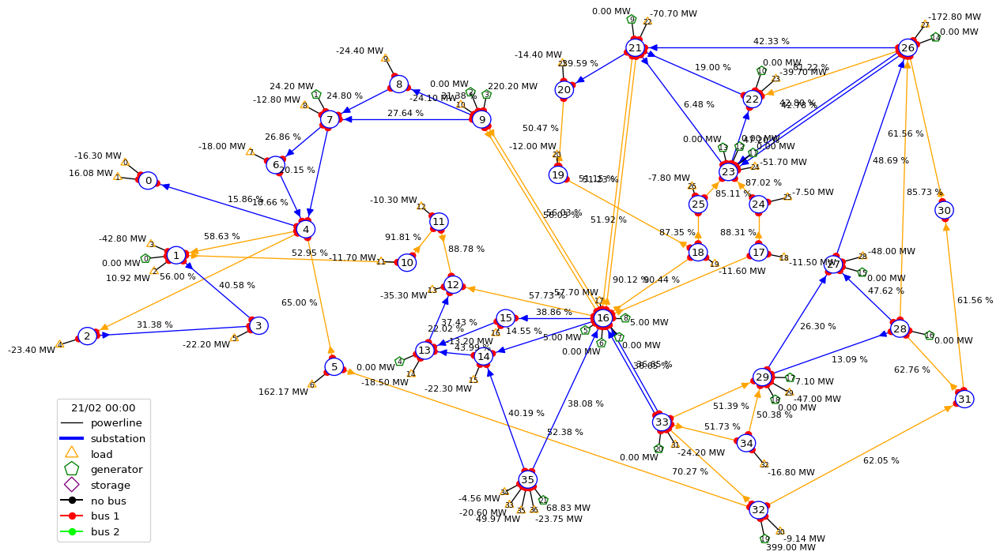

In [40]:
# plotting the observation of environment
env.seed(42)
obs = env.reset()
plot_helper = PlotMatplot(env.observation_space)
_ = plot_helper.plot_obs(obs)

print("Number of generators of the powergrid: {}".format(obs.n_gen))
print("Number of loads of the powergrid: {}".format(obs.n_load))
print("Number of powerline of the powergrid: {}".format(obs.n_line))

## 2. Generation of feasible actions

Just coonsidering topology change actions, its exponential.It is possible to change the status of the powerline, meaning connecting or disconnecting them. If there are N powerlines, the number of such possible actions is $N^2$, in our case its ~ $66K$ such actions .

Since not all actions will generate satisfactory result we first feed multiple senarios to our fuuction and then based on overload result we filter out most frequent once. This resulted to $177$ actions.

This reduction in action space will enable us to make appropriate decision fast in case of an attack on power grid.



In [18]:
# function for topology search 

def topology_search(env):
    obs = env.get_obs()
    min_rho, overflow_id = obs.rho.max(), obs.rho.argmax()    
    print("step-%s, line-%s(from bus-%d to bus-%d) overflows, max rho is %.5f" %
          (dst_step, overflow_id, env.line_or_to_subid[overflow_id],
           env.line_ex_to_subid[overflow_id], obs.rho.max()))
    
    all_actions = env.action_space.get_all_unitary_topologies_change(env.action_space) 
    # getting all possible action    
    action_chosen = env.action_space({})    
    for action in all_actions:        
        if not env._game_rules(action, env):
            continue            
        obs_, _, done, _ = obs.simulate(action)
        if (not done) and (obs_.rho.max() < min_rho):
            min_rho = obs_.rho.max()
            action_chosen = action            
    print("find a greedy action and max rho decreases to %.5f" %(min_rho))    
    return action_chosen

# In case the grid is safe, we try to reconnect the disconnected line (if possible)

def find_best_line_to_reconnect(obs, original_action):
    
    disconnected_lines = np.where(obs.line_status == False)[0]
    
    if not len(disconnected_lines):
        return original_action
    
    o, _, _, _ = obs.simulate(original_action)
    
    min_rho = o.rho.max()
    line_to_reconnect = -1
    
    for line in disconnected_lines:
        if not obs.time_before_cooldown_line[line]:
            reconnect_array = np.zeros_like(obs.rho, dtype=int)
            reconnect_array[line] = 1
            reconnect_action = deepcopy(original_action)
            reconnect_action.update({'set_line_status': reconnect_array})
            if not is_legal(reconnect_action, obs):
                continue
            o, _, _, _ = obs.simulate(reconnect_action)
            if o.rho.max() < min_rho:
                line_to_reconnect = line
                min_rho = o.rho.max()
    if line_to_reconnect != -1:
        reconnect_array = np.zeros_like(obs.rho,dtype=int)
        reconnect_array[line_to_reconnect] = 1
        original_action.update({'set_line_status': reconnect_array})
    return original_action

def is_legal(action, obs):
    
    if 'change_bus_vect' not in action.as_dict():
        return True
    
    substation_to_operate = int(action.as_dict()['change_bus_vect']['modif_subs_id'][0])
    
    if obs.time_before_cooldown_sub[substation_to_operate]:
        return False
    
    for line in [eval(key) for key, val in action.as_dict()['change_bus_vect'][str(substation_to_operate)].items() if 'line' in val['type']]:
        if obs.time_before_cooldown_line[line] or not obs.line_status[line]:
            return False
        
    return True

def save_sample(save_path='./'):
    if action == env.action_space({}):
        return None  # not necessary to save a "do nothing" action
    act_or, act_ex, act_gen, act_load = [], [], [], []
    for key, val in action.as_dict()['change_bus_vect'][action.as_dict()['change_bus_vect']['modif_subs_id'][0]].items():
        if val['type'] == 'line (extremity)':
            act_ex.append(key)
        elif val['type'] == 'line (origin)':
            act_or.append(key)
        elif val['type'] == 'load':
            act_load.append(key)
        else:
            act_gen.append(key)
    pd.concat(
        (
            pd.DataFrame(
                np.array(
                    [env.chronics_handler.get_name(), dst_step, None, None, None,
                     str(np.where(obs.rho > 1)[0].tolist()),
                     str([i for i in np.around(obs.rho[np.where(obs.rho > 1)], 2)]),
                     action.as_dict()['change_bus_vect']['modif_subs_id'][0], act_or, act_ex, act_gen, act_load,
                     obs.rho.max(), obs.rho.argmax(), obs_.rho.max(), obs_.rho.argmax()]).reshape([1, -1])),
            pd.DataFrame(np.concatenate((obs.to_vect(), obs_.to_vect(), action.to_vect())).reshape([1, -1]))
        ),
        axis=1
    ).to_csv(os.path.join(save_path, 'Experiences1.csv'), index=0, header=0, mode='a')



In [19]:
# Generating all the action space 

SAVE_PATH = './'
NUM_EPISODE = 100 #1000

for episode in range(NUM_EPISODE):
    try:
    # if lightsim2grid is available, use it.
        from lightsim2grid import LightSimBackend
        backend = LightSimBackend()
        env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH, backend=backend)
    except:
        env = grid2op.make(dataset=DATA_PATH, chronics_path=SCENARIO_PATH)
    env.chronics_handler.shuffle(shuffler=lambda x: x[np.random.choice(len(x), size=len(x), replace=False)])
    for chronic in range(len(os.listdir(SCENARIO_PATH))):
        env.reset()
        # dst_step = random.randint(0, 8000)
        dst_step = 0
        print('Scenario to test is [%s]，start from step-%d... ...' % (env.chronics_handler.get_name(), dst_step))
        env.fast_forward_chronics(dst_step)
        obs, done = env.get_obs(), False
        while not done:
            if obs.rho.max() >= 1:
                action = topology_search(env)
                obs_, reward, done, _ = env.step(action)
                save_sample(SAVE_PATH)
                obs = obs_
            else:
                action = env.action_space({})
                action = find_best_line_to_reconnect(obs, action)
                obs, reward, done, _ = env.step(action)
                dst_step += 1

## 3. topology_agent creation

We run different episodes to generate all possible action on senarios then filter out most frequent once, this would be used by topology agent to take actions on the environment in case of an attack like overload.

In [22]:
def filter_data(data):
    data['del'] = False
    for row in range(len(data) - 1):
        if data.iloc[row, 12] - data.iloc[row, 14] < 0.02:
            # this action decreases rho less than 2%
            data.iloc[row, -1] = True
        if data.iloc[row, 7] == 'None':
            # this action is "do nothing"
            data.iloc[row, -1] = True
    return data


def save_action_space(data, save_path, threshold=0):
    actions = data.iloc[:, -495:-1].astype(np.int16)
    actions['action_list'] = actions.apply(lambda s: str([i for i in s.values]), axis=1)
    nums = pd.value_counts(actions['action_list'])
    # filter out actions that occur less frequently
    # the actions that occur times less than the threshold would be filtered out
    action_space = np.array([eval(item) for item in nums[nums >= threshold].index.values])
    file = os.path.join(save_path, 'actions%d.npy' % action_space.shape[0])
    np.save(file, action_space)
    print('generate an action space with the size of %d' % action_space.shape[0])


if __name__ == "__main__":
    # hyper-parameters
    TABLES = ["./Experiences1.csv"]  # Use your own data
    SAVE_PATH = "./ActionSpace"
    THRESHOLD = 1

    data = pd.read_csv("./Experiences1.csv", header=None)
    data = filter_data(data)
    save_action_space(data, SAVE_PATH, THRESHOLD)
    


Scenario to test is [Scenario_february_dummy]，start from step-0... ...
step-191, line-13(from bus-11 to bus-12) overflows, max rho is 1.01122


KeyboardInterrupt: 

In [85]:
class topology_agent(BaseAgent):
    def __init__(self, action_space, this_directory_path='./'):
        ''' Initailize agent'''
        BaseAgent.__init__(self, action_space=action_space)
        '''actions import '''
        self.actions_ordinary = np.load(os.path.join(this_directory_path, 'actions177.npy'))


        '''details chosen from observation'''
        # p: the active power produced at this node (MW)
        # q: the reactive power produced at this node (MVar)
        # v: the voltage magnitude at this node  (kV)
        # cooldown: how much longer you need to wait before being able to merge / split or change this node
        
       
        self.last_step = datetime.datetime.now()
        self.recovery_stack = []
        self.overflow_steps = 0

    def find_best_line_to_reconnect(self, obs, original_action):
        disconnected_lines = np.where(obs.line_status == False)[0] # given disconnected line array
        if not len(disconnected_lines): # the number of disconnected lines
            return original_action
        if (obs.time_before_cooldown_line[disconnected_lines] > 0).all():
            return original_action
        o, _, _, _ = obs.simulate(original_action)
        min_rho = o.rho.max()
        line_to_reconnect = -1
        for line in disconnected_lines:
            if not obs.time_before_cooldown_line[line]:
                reconnect_array = np.zeros_like(obs.rho, dtype = int)
                reconnect_array[line] = 1
                reconnect_action = deepcopy(original_action)
                reconnect_action.update({'set_line_status': reconnect_array})
                if not self.is_legal(reconnect_action, obs):
                    continue
                o, _, _, _ = obs.simulate(reconnect_action)
                if o.rho.max() < min_rho:
                    line_to_reconnect = line
                    min_rho = o.rho.max()
        if line_to_reconnect != -1:
            reconnect_array = np.zeros_like(obs.rho, dtype = int)
            reconnect_array[line_to_reconnect] = 1
            original_action.update({'set_line_status': reconnect_array})
        return original_action

    def array2action(self, array):
        action = self.action_space({'change_bus': array[236:413]})
        action._change_bus_vect = action._change_bus_vect.astype(bool)
        return action

    def is_legal(self, action, obs):
        adict = action.as_dict()
        if 'change_bus_vect' not in adict:
            return True
        substation_to_operate = int(adict['change_bus_vect']['modif_subs_id'][0])
        if obs.time_before_cooldown_sub[substation_to_operate]:
            return False
        for line in [eval(key) for key, val in adict['change_bus_vect'][str(substation_to_operate)].items()
                     if 'line' in val['type']]:
            if obs.time_before_cooldown_line[line] or not obs.line_status[line]:
                return False
        return True

    def act(self, observation, reward, done):
        
        tnow = observation.get_time_stamp()

        if self.last_step + datetime.timedelta(minutes=5) != tnow:
            print('\n\nscenario changes！')
            self.recovery_stack = []
        
        self.last_step = tnow

        if observation.rho.max() >= 1:
            self.overflow_steps += 1
        else:
            self.overflow_steps = 0

        # case: secure
        threshold_this_step = 0.999
        if observation.rho.max() < threshold_this_step:  # fixed threshold
            if (self.recovery_stack == []) or (not self.is_legal(self.array2action(self.actions_ordinary[self.recovery_stack[0]]), observation)):
                a = self.action_space({})
            else:
                o, r, d, i = observation.simulate(self.array2action(self.actions_ordinary[self.recovery_stack[0]]))
                if (not d) and (o.rho.max() < 0.98):
                    aid = self.recovery_stack.pop(0)
                    a = self.array2action(self.actions_ordinary[aid])
                else:
                    a = self.action_space({})
            return self.find_best_line_to_reconnect(observation, a)
        
        # case: dangerous
        o, _, d, _ = observation.simulate(self.action_space({}))
        min_rho = o.rho.max() if not d else 10
        print('%s, heavy load, line-%d load is %.2f' % (str(observation.get_time_stamp()), observation.rho.argmax(), observation.rho.max()))

        action_chosen = None
        id_second_search = None
        min_rho0 = min_rho
        for idx, action_array in enumerate(self.actions_ordinary):
            a = self.array2action(action_array)
            if not self.is_legal(a, observation):
                continue
            obs, _, done, _ = observation.simulate(a)
            if done:
                continue
            if obs.rho.max() < min(min_rho, min_rho0 - 0.03):
                min_rho = obs.rho.max()
                action_chosen = a
                id_second_search = idx
        if id_second_search:
            self.recovery_stack.append(id_second_search)


        return  self.find_best_line_to_reconnect(observation, action_chosen) if action_chosen else self.find_best_line_to_reconnect(observation, self.action_space({}))

def make_agent(env, this_directory_path):
    my_agent = topology_agent(env.action_space, this_directory_path)
    return my_agent

## 4. Evaluation of Agent

Evaluation is done in two steps:

#### Rewards from runner

 - the highest the number of scenarios our agent perform before a game over and the number of time steps our agent can actually manage without game over. The higher of rewards and time step survival would indicate better performance.

#### Submission on **L2RPN NEURIPS 2020 - Robustness Track**

- the lowest the redispatching, since in this agent we are focus on topology chnages, we would not be effected by this.
- the losses. Due to [Joule's effect](https://en.wikipedia.org/wiki/Joule_effect) most TSO have somehow to compensate the losses on the grid. In that case, the lower the losses, the better. 

### 4.1 Evaluation of PowerLineSwitch agent

In [1]:
#PowerLineSwitch agent

max_iter = 200 #customize
n_episode = 2 #customize

from grid2op.Agent import PowerLineSwitch
runner = Runner(**env.get_params_for_runner(),
                agentClass=PowerLineSwitch
               )
res = runner.run(nb_episode=n_episode, max_iter=max_iter)
print("The results for the PowerLineSwitch agent are:")
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    msg_tmp = "\tFor chronics with id {}\n".format(chron_name)
    msg_tmp += "\t\t - cumulative reward: {:.6f}\n".format(cum_reward)
    msg_tmp += "\t\t - number of time steps completed: {:.0f} / {:.0f}".format(nb_time_step, max_ts)
    print(msg_tmp)

ModuleNotFoundError: No module named 'grid2op'

### 4.2 Evaluation of SwitchingAgent

In [ ]:
class SwitchingAgentV2(GreedyAgent):

    #This method is used to initialise class in python. We have inherited properties 
    #from greedy agent which requires only action space to run hence no extra parameter needed
    def __init__(self, action_space):
        GreedyAgent.__init__(self, action_space)

    #This function is important here we simulate reward and choose the action whose reward is maximum
    def act(self, observation, reward, done=False):
        
        #here we selecting top 60 actions which are provided by get tested action function
        self.tested_action = self._get_tested_action(observation)
        
        #this loop is creating the reward matrix based on number of actions provided to it 
        if len(self.tested_action) > 1:
            self.resulting_rewards = np.full(
                shape=len(self.tested_action), fill_value=np.NaN, dtype=dt_float
            )
            #Below forloop will iterate through every action, and simulate the reward and save it in reward matrix created above
            #it will then select the index of the reward with maximum value and fetch 
            #the best action based on that reward and return it
            for i, action in enumerate(self.tested_action):
                (
                    simul_obs,
                    simul_reward, #here it is simulating the reward
                    simul_has_error,
                    simul_info,
                ) = observation.simulate(action)
                self.resulting_rewards[i] = simul_reward
            reward_idx = int(
                np.argmax(self.resulting_rewards) #fetching the index of reward with maximum value
            )  # rewards.index(max(rewards))
            best_action = self.tested_action[reward_idx] #selecting the best action based on the reward index
            #print(reward_idx)
        else:
            best_action = self.tested_action[0]
        #print(best_action)
        return best_action
    
    
    # previously this method used to just connect and disconnect the powerline, and if it was connecting the powerline 
    # then it was connecting it to only bus 1
    # currently this function is performing 3 actions
    # 1. is the same as I previously mentioned
    # 2. it will change the bus of origin end of powerline (it will connect it to bus 1 if it was 2 vice versa)
    # 3. it will change the bus of extrimity end of powerline (it will connect it to bus 1 if it was 2 vice versa)
    # it will then feed the output to act function above
    def _get_tested_action(self, observation):
        res = [self.action_space({})]  # add the do nothing
        for i in range(self.action_space.n_line):
            for toggle_action in range(3): #Added this toggle to choose 3 actions
                tmp = np.full(self.action_space.n_line, fill_value=False, dtype=dt_bool)
                tmp[i] = True
                if toggle_action == 0:
                    action = self.action_space({"change_line_status": tmp}) # it will connect or disconnect the powerline
                    if not observation.line_status[i]: #if it is connecting the powerline it will connect to bus 1 only (no logic just random)
                        # so the action consisted in reconnecting the powerline
                        # i need to say on which bus (always on bus 1 for this type of agent)
                        action = action.update(
                            {"set_bus": {"lines_or_id": [(i, 1)], "lines_ex_id": [(i, 1)]}})
                    res.append(action)
                elif toggle_action == 1:
                    if observation.line_status[i]: #this is checking if the powerline is already connected, it will take action only if its connected
                        # this will change the bus of origin end of a powerline i(it will connect it to bus 1 if it was 2 vice versa)
                        action = self.action_space({"change_bus": {"lines_or_id": i}}) 
                        res.append(action)
                elif toggle_action == 2:
                    if observation.line_status[i]: #this is checking if the powerline is already connected, it will take action only if its connected
                        # this will change the bus of extrimity end of a powerline i(it will connect it to bus 1 if it was 2 vice versa)
                        action = self.action_space({"change_bus": {"lines_ex_id": i}}) 
                        res.append(action)
        return res
    


In [ ]:
SwitchingAgent = SwitchingAgentV2(env.action_space)

max_iter = 200 #customize
n_episode = 2 #customize

from grid2op.Agent import PowerLineSwitch

runner = Runner(**env.get_params_for_runner(),
                agentInstance=SwitchingAgent, agentClass=None)
res = runner.run(nb_episode=n_episode, max_iter=max_iter)
print("The results for the SwitchingAgent agent are:")
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    msg_tmp = "\tFor chronics with id {}\n".format(chron_name)
    msg_tmp += "\t\t - cumulative reward: {:.6f}\n".format(cum_reward)
    msg_tmp += "\t\t - number of time steps completed: {:.0f} / {:.0f}".format(nb_time_step, max_ts)
    print(msg_tmp)


### 4.3 Evaluation of TopologyAgent



scenario changes！


scenario changes！
2012-02-21 01:35:00, heavy load, line-32 load is 1.02
2012-02-21 01:40:00, heavy load, line-32 load is 1.02
2012-02-21 01:45:00, heavy load, line-32 load is 1.01
2012-02-21 01:50:00, heavy load, line-39 load is 1.17
2012-02-21 01:55:00, heavy load, line-39 load is 1.17
2012-02-21 02:00:00, heavy load, line-39 load is 1.17
2012-02-21 02:05:00, heavy load, line-38 load is 1.03
2012-02-21 02:10:00, heavy load, line-38 load is 1.04
2012-02-21 02:15:00, heavy load, line-38 load is 1.03
2012-02-21 02:20:00, heavy load, line-28 load is 2.66
2012-02-21 02:25:00, heavy load, line-28 load is 2.65
2012-02-21 02:30:00, heavy load, line-28 load is 2.62
The results for the custom agent are:
	For chronics with id Scenario_august_dummly
		 - cumulative reward: 15326.125000
		 - number of time steps completed: 200 / 200
	For chronics with id Scenario_february_dummy
		 - cumulative reward: 2133.402832
		 - number of time steps completed: 31 / 200


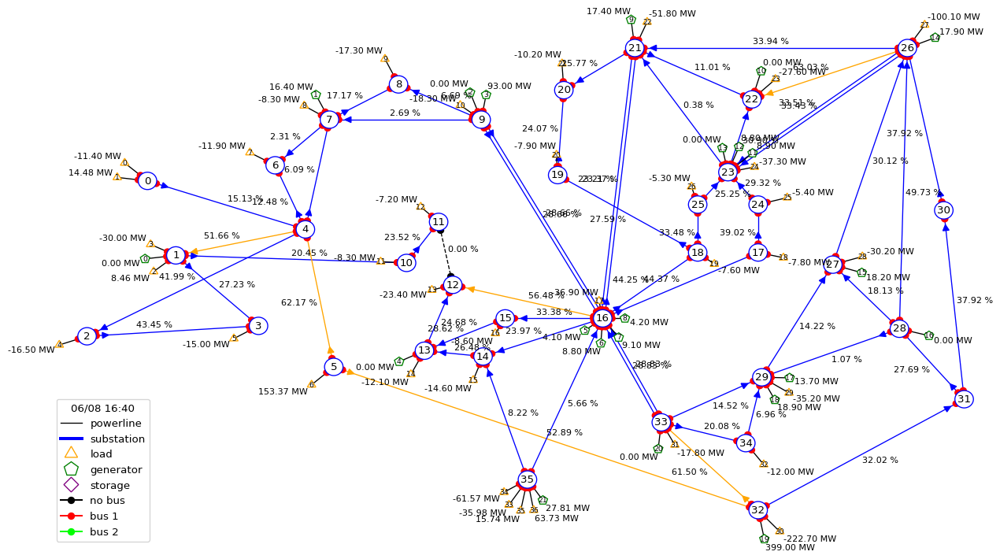

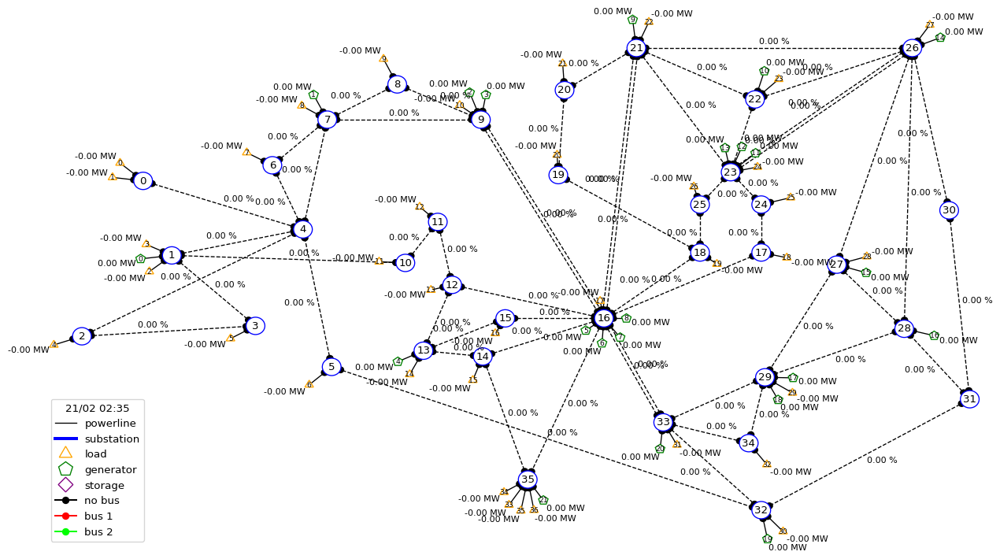

In [88]:
max_iter = 200 #customize
n_episode = 2 #customize
from grid2op.Runner import Runner
# from grid2op.Agent import DoNothingAgent
from grid2op.Reward import L2RPNReward
from grid2op.Chronics import GridStateFromFileWithForecasts

path_saved_data = './Res'
if not os.path.exists(path_saved_data):
    os.mkdir(path_saved_data)


runner = Runner(**env.get_params_for_runner(),
                agentClass=topology_agent)
res = runner.run(nb_episode=n_episode, max_iter=max_iter, path_save=path_saved_data)
print("The results for the topology_agent are:")
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    msg_tmp = "\tFor chronics with id {}\n".format(chron_name)
    msg_tmp += "\t\t - cumulative reward: {:.6f}\n".format(cum_reward)
    msg_tmp += "\t\t - number of time steps completed: {:.0f} / {:.0f}".format(nb_time_step, max_ts)
    print(msg_tmp)
    
    
gif_name = "episode"   
ep_replay = EpisodeReplay(agent_path=path_saved_data)
for _, chron_name, cum_reward, nb_time_step, max_ts in res:
    ep_replay.replay_episode(chron_name,  # which chronic was started
                             gif_name=gif_name, # Name of the gif file
                             display=False,  # dont wait before rendering each frames
                             fps=3.0)  # limit to 3 frames per second
    
    


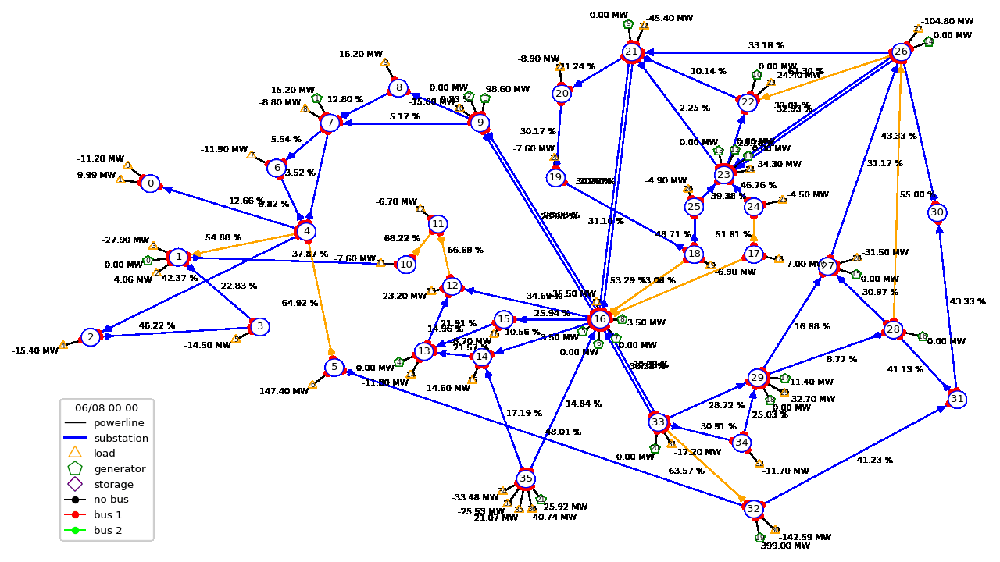

In [104]:
gif_path = 'C:/Users/Shanks/Desktop/L2RPN Agent/Res/Scenario_february_dummy/*.gif'

my_gif = glob.glob(gif_path)
img = None
if len(my_gif):
    my_gif = my_gif[0]
    img = Image(filename=my_gif)
    display(img)
else:
    print("No gif were generated, your agent probably fails before.")

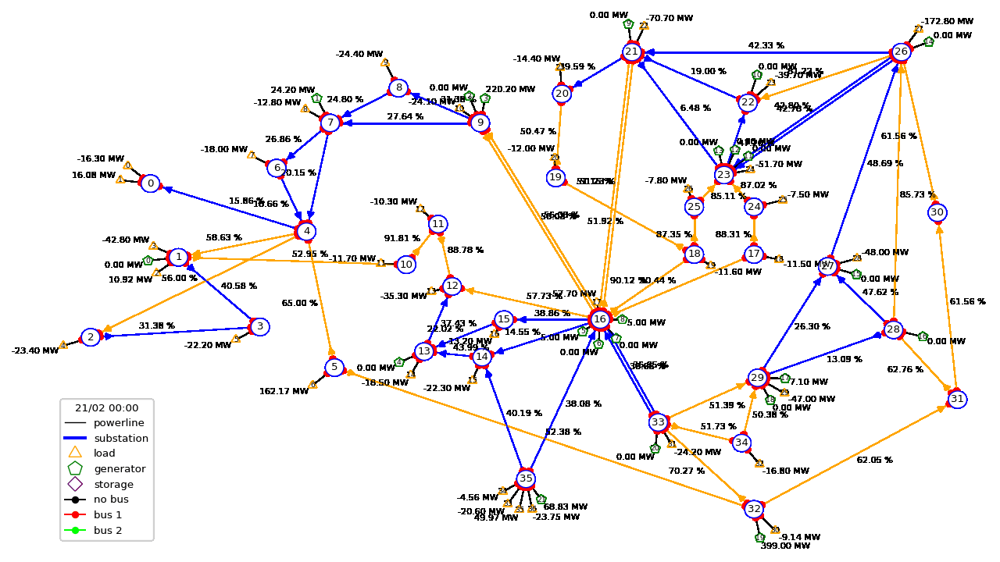

In [105]:
gif_path = 'C:/Users/Shanks/Desktop/L2RPN Agent/Res/Scenario_february_dummy/*.gif'

my_gif = glob.glob(gif_path)
img = None
if len(my_gif):
    my_gif = my_gif[0]
    img = Image(filename=my_gif)
    display(img)
else:
    print("No gif were generated, your agent probably fails before.")

## 5. Conclusion

Grid2op provides various environment with different scenarios to evaluate the performance of an agent. In the real world application emphasis is more how an agent can survive scenarios and at the same time it's interpretability. 

Huge amount of topology actions ($2^N$) makes this complex task more difficult. Our approach focused on one particular environment, generate all possible actions which we can take and filter out those which reduced the overload.
Then provide this to our topoloy_agent which refere these previous actions on grid to make decisions.

In comparison to PowerLineSwitch and SwitchingAgent which greedily select a line to connect and disconnect our topology agent performance was superior. It was able to survive all timesteps in one scenario and work relatively better in other one in comparison to rest of the agents.
